In [181]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from datetime import timedelta

In [182]:
df1 = pd.read_csv('../data/data_casal_montserratina/Casal_Montserratina_202201_202206.csv', delimiter=';')
df2 = pd.read_csv('../data/data_casal_montserratina/Casal_Montserratina_202207_202212.csv', delimiter=';')
df3 = pd.read_csv('../data/data_casal_montserratina/Casal_Montserratina_202301_202306.csv', delimiter=';')
df4 = pd.read_csv('../data/data_casal_montserratina/Casal_Montserratina_202307_202312.csv', delimiter=';')
df5 = pd.read_csv('../data/data_casal_montserratina/Casal_Montserratina_202401_202405.csv', delimiter=';')
df = pd.concat([df1, df2, df3, df4, df5], axis=0)
df

,TimeStamp,Valor,Període tarifari,Tipus lectura
0,01/01/2022 00:00,6,6,Real
1,01/01/2022 01:00,6,6,Real
2,01/01/2022 02:00,5,6,Real
3,01/01/2022 03:00,7,6,Real
4,01/01/2022 04:00,7,6,Real
...,...,...,...,...
1363,07/05/2024 19:00,10,4,Real
1364,07/05/2024 20:00,7,4,Real
1365,07/05/2024 21:00,4,4,Real
1366,07/05/2024 22:00,2,5,Real


In [183]:
df = df.rename(columns={'TimeStamp': 'Date', 'Valor':'Demand'})
df = df.drop(columns=["Període tarifari", "Tipus lectura"], axis=1)
df["Date"] = pd.to_datetime(df["Date"], format='%d/%m/%Y %H:%M')
df.set_index("Date", inplace=True)
df

,Demand
Date,
2022-01-01 00:00:00,6
2022-01-01 01:00:00,6
2022-01-01 02:00:00,5
2022-01-01 03:00:00,7
2022-01-01 04:00:00,7
...,...
2024-05-07 19:00:00,10
2024-05-07 20:00:00,7
2024-05-07 21:00:00,4


In [184]:
# Weekly Demand Plot
whole_df_1w = df.resample('1W').mean()
fig = go.Figure()
fig.add_trace(go.Scatter(x=whole_df_1w.index, y=whole_df_1w["Demand"], mode='lines'))
fig.update_layout(
    title = "Weekly Energy Demand",
    xaxis_title = "Date",
    yaxis_title = "Demand (kWh)",
    width = 850,
    height = 400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

In [185]:
import calendar
from plotly.subplots import make_subplots
def plot_monthly_demand(df):
    df = df.copy()
    if not pd.api.types.is_datetime64_any_dtype(df.index):
        df.index = pd.to_datetime(df.index)
    
    groups = df.groupby([df.index.year, df.index.month])
    num_plots = len(groups)
    fig = make_subplots(rows=6, cols=2, subplot_titles=[calendar.month_name[i] for i in range(1, 13)], horizontal_spacing=0.1, vertical_spacing=0.05)
    #colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']
    colors = ['blue', 'orange', 'green']

    for month in range(1, 13):
        row = (month - 1) // 2 + 1
        col = (month - 1) % 2 + 1
        monthly_data = df[df.index.month == month]
        unique_years = monthly_data.index.year.unique()
        for i, year in enumerate(unique_years):
            year_data = monthly_data[monthly_data.index.year == year]
            year_data = year_data.copy()
            year_data.index = year_data.index.map(lambda x: x.replace(year=2022))  # Normalizar el año para superponer curvas
            fig.add_trace(
                go.Scatter(x=year_data.index, y=year_data["Demand"], mode='lines', name=f"{year}",
                           legendgroup=f"{month}", line=dict(color=colors[i % len(colors)]), showlegend=False),
                row=row, col=col
            )
        if month == 1:
            for i, year in enumerate(unique_years):
                fig.add_trace(
                    go.Scatter(x=[None], y=[None], mode='lines', name=f"{year}",
                            legendgroup=f"{month}", line=dict(color=colors[i % len(colors)]), showlegend=True),
                    row=row, col=col
                )
                
        fig.update_xaxes(title_text="Date", row=row, col=col)
        fig.update_yaxes(title_text="Demand (kWh)", row=row, col=col)
    fig.update_layout(
        title = {
            "text": "Monthly Energy Demand",
            'x': 0.5,
            'xanchor': 'center'
        },
        xaxis_title="Date",
        yaxis_title="Demand (kWh)",
        width=1700,
        height=2200,
        margin=dict(l=20, r=20, t=45, b=20)   
    )
    fig.show()
plot_monthly_demand(df)

In [186]:
start_date = df.index.min() + timedelta(days=7)
end_date = start_date + timedelta(days=7)
df_week1 = df.loc[(df.index >= start_date) & (df.index <= end_date)]
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_week1.index, y=df_week1["Demand"], mode='lines'))
fig.update_layout(
    title = "One Week Energy Demand",
    xaxis_title = "Date",
    yaxis_title = "Demand (MWh)",
    width = 850,
    height = 400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

### Missing Values

In [187]:
def checkMissingData(df):
    min_date = df.index.min()
    max_date = df.index.max()

    date_range = pd.date_range(start=min_date, end=max_date, freq='h')
    missing_dates = date_range[~date_range.isin(df.index)]
    print(f"Number of Missing Values: {missing_dates.shape[0]}")
    return None if missing_dates.shape[0] == 0 else missing_dates, date_range
missing_dates, date_range = checkMissingData(df)

Number of Missing Values: 2906


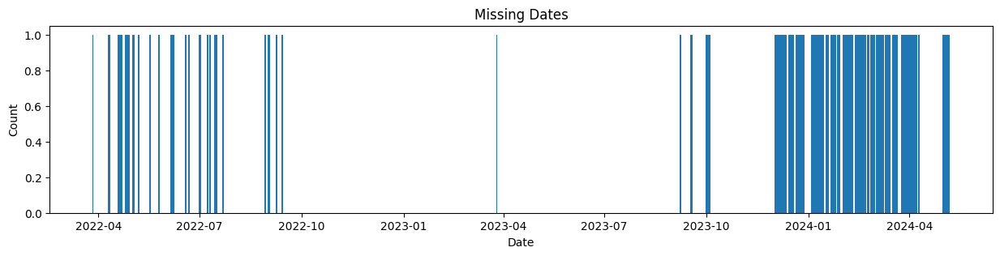

In [188]:
plt.figure(figsize=(15, 3))
plt.bar(missing_dates, [1] * len(missing_dates))
plt.title("Missing Dates")
plt.xlabel("Date")
plt.ylabel("Count")
plt.show()

In [189]:
df = df[~df.index.duplicated(keep='first')]

In [190]:
min_date = df.index.min()
max_date = df.index.max()
date_range = pd.date_range(start=min_date, end=max_date, freq='h')
df = df.reindex(date_range)
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df.index,  
    y=df['Demand'], 
    mode='lines', 
    name='Line'  
))

# Layout parameters
fig.update_layout(
    title='Demanda Eléctrico Casal La Monserratina',  
    xaxis_title='Consumo [kW]', 
    yaxis_title='',  
    xaxis_tickangle=0, 
    showlegend=False,     
)

In [191]:
df = df.loc[(df.index >= pd.to_datetime('2022-01-07 0:00', format='%Y-%d-%m %H:%M'))]
df = df.loc[(df.index <= pd.to_datetime('2023-01-11 0:00', format='%Y-%d-%m %H:%M'))]
print("Nº of NaNs: ", df["Demand"].isna().sum())

df["Demand"].interpolate(method="linear", limit=4, inplace=True)
df.dropna(inplace=True)

Nº of NaNs:  361


In [192]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df.index,  
    y=df['Demand'], 
    mode='lines', 
    name='Line'  
))

# Layout parameters
fig.update_layout(
    title='Demanda Eléctrico Casal La Monserratina',  
    xaxis_title='Consumo [kW]', 
    yaxis_title='',  
    xaxis_tickangle=0, 
    showlegend=False,     
)

In [193]:
df = df.reset_index()
df.rename(columns={'index': 'Date'}, inplace=True)

In [194]:
# Load the DataFrame from the pickle file
df.set_index("Date", inplace=True)
df = df.resample('15min').interpolate(method='time')
df.reset_index(inplace=True)
df_PV = pd.read_pickle("../data/data_casal_montserratina/LaMonserratina_weather_&_PV_2022_2023.pkl")
df_PV.rename(columns={"timestamp_local": "Date"}, inplace=True)
#df_PV.set_index("Date", inplace=True)
df_PV.head(3)

,Date,pres [mb],slp [mb],wind_dir [m/s],wind_gust_spd [m/s],wind_spd [m/s],temp [C],app_temp [C],rh [%],dewpt [C],...,PV,Temp interna Modulo [C],PV Wh,Year,Month,Hour,DayOfWeek,DayOfYear,Day,Minute
0,2022-01-01 00:00:00,1027.0,1028.0,360.0,4.0,1.0,10.7,10.7,92.0,9.500,...,0.0,22.066196,0.0,2022,1,0,5,1,1,0
1,2022-01-01 00:15:00,1027.0,1028.0,357.5,4.1,1.4,10.7,10.7,91.0,9.325,...,0.0,22.066196,0.0,2022,1,0,5,1,1,15
2,2022-01-01 00:30:00,1027.0,1028.0,355.0,4.2,1.8,10.7,10.7,90.0,9.150,...,0.0,22.066196,0.0,2022,1,0,5,1,1,30


In [195]:
df = df_PV.merge(df, how="inner", on=["Date", "Date"])

df.set_index("Date", inplace=True)

df.reset_index(inplace=True)
df.rename(columns={'Demand': 'Consumo_red [kW]'}, inplace=True)

df["PV [kW]"] = (df["PV"]/1000000).round(3)
df.drop(columns=["PV"], inplace=True)
df["Consumo_total [kW]"] = df["Consumo_red [kW]"] + df["PV [kW]"]
df.drop(columns=["Consumo_red [kW]", "PV [kW]", "PV Wh", "app_temp [C]"], inplace=True)
df.rename(columns={'Consumo_total [kW]': 'Demand'}, inplace=True)
df

,Date,pres [mb],slp [mb],wind_dir [m/s],wind_gust_spd [m/s],wind_spd [m/s],temp [C],rh [%],dewpt [C],clouds [%],...,Temp interna Modulo,Temp interna Modulo [C],Year,Month,Hour,DayOfWeek,DayOfYear,Day,Minute,Demand
0,2022-07-02 00:00:00,1019.0,1020.0,150.00,2.8,1.50,23.100,59.00,14.70,0.0,...,27.667375,27.667375,2022,7,0,5,183,2,0,3.00
1,2022-07-02 00:15:00,1019.0,1020.0,192.50,2.6,1.50,22.825,60.25,14.75,0.0,...,27.543155,27.543155,2022,7,0,5,183,2,15,2.75
2,2022-07-02 00:30:00,1019.0,1020.0,235.00,2.4,1.50,22.550,61.50,14.80,0.0,...,27.418935,27.418935,2022,7,0,5,183,2,30,2.50
3,2022-07-02 00:45:00,1019.0,1020.0,277.50,2.2,1.50,22.275,62.75,14.85,0.0,...,27.294716,27.294716,2022,7,0,5,183,2,45,2.25
4,2022-07-02 01:00:00,1019.0,1020.0,320.00,2.0,1.50,22.000,64.00,14.90,0.0,...,27.170496,27.170496,2022,7,1,5,183,2,0,2.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46748,2023-10-31 23:00:00,1014.0,1015.0,315.00,5.6,3.60,14.200,61.00,6.80,25.0,...,23.647174,23.647174,2023,10,23,1,304,31,0,2.00
46749,2023-10-31 23:15:00,1014.0,1015.0,318.75,5.5,2.95,13.950,62.25,6.85,25.0,...,23.534247,23.534247,2023,10,23,1,304,31,15,2.25
46750,2023-10-31 23:30:00,1014.0,1015.0,322.50,5.4,2.30,13.700,63.50,6.90,25.0,...,23.421320,23.421320,2023,10,23,1,304,31,30,2.50
46751,2023-10-31 23:45:00,1014.0,1015.0,326.25,5.3,1.65,13.450,64.75,6.95,25.0,...,23.308393,23.308393,2023,10,23,1,304,31,45,2.75


In [196]:
display(df.describe())
'''
df.set_index("Date", inplace=True)
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df.index,  
    y=df['PV [kW]'], 
    mode='lines', 
    name='Line'  
))
df.reset_index(inplace=True)
# Layout parameters
fig.update_layout(
    title='Demanda Eléctrico Casal La Monserratina',  
    xaxis_title='Consumo [kW]', 
    yaxis_title='',  
    xaxis_tickangle=0, 
    showlegend=False,     
)
'''
#Outliers
def getNumberOfOutliersPerColumn(df, columns_list):
    for col in columns_list:
        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3 - q1

        #Calcular los límites inferiores y superiores para identificar outliers
        lim_inf = q1 - 1.5 * iqr
        lim_sup = q3 + 1.5 * iqr

        outliers = ((df[col] < lim_inf) | (df[col] > lim_sup))
        print(f"For {col} Column, the Number of Outliers is {outliers.sum()}\n")


getNumberOfOutliersPerColumn(df, df.columns.drop("Date"))

,Date,pres [mb],slp [mb],wind_dir [m/s],wind_gust_spd [m/s],wind_spd [m/s],temp [C],rh [%],dewpt [C],clouds [%],...,Temp interna Modulo,Temp interna Modulo [C],Year,Month,Hour,DayOfWeek,DayOfYear,Day,Minute,Demand
count,46753,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,...,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000
mean,2023-03-02 11:59:59.999999744,1015.546393,1016.178545,210.974697,5.927489,3.961613,19.660363,69.151595,13.546832,28.159615,...,34.205083,34.205083,2022.624238,7.022672,11.499754,2.999979,198.158343,15.790238,22.499519,6.146578
min,2022-07-02 00:00:00,987.000000,987.000000,10.000000,1.000000,0.000000,-0.500000,14.000000,-13.300000,0.000000,...,17.007066,17.007066,2022.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
25%,2022-10-31 18:00:00,1012.250000,1013.000000,120.000000,3.967500,2.600000,14.525000,61.000000,8.875000,15.250000,...,25.589518,25.589518,2022.000000,5.000000,5.000000,1.000000,122.000000,8.000000,0.000000,2.500000
50%,2023-03-02 12:00:00,1015.000000,1016.000000,225.000000,5.300000,3.600000,20.500000,70.750000,14.950000,25.000000,...,29.971086,29.971086,2023.000000,8.000000,11.000000,3.000000,213.000000,16.000000,15.000000,4.387000
75%,2023-07-02 06:00:00,1018.250000,1019.000000,297.500000,7.300000,4.992500,25.300000,79.000000,19.200000,31.000000,...,44.373909,44.373909,2023.000000,10.000000,17.000000,5.000000,274.000000,23.000000,30.000000,6.848000
max,2023-11-01 00:00:00,1038.000000,1038.000000,360.000000,25.700000,8.800000,34.700000,98.000000,26.700000,100.000000,...,53.388000,53.388000,2023.000000,12.000000,23.000000,6.000000,365.000000,31.000000,45.000000,55.696000
std,NaN,6.222663,6.231817,106.476741,2.810023,1.837103,6.898019,13.126189,7.096707,20.193962,...,10.142170,10.142170,0.484324,3.156076,6.922391,2.005132,96.534862,8.800891,16.770833,6.066826


For pres [mb] Column, the Number of Outliers is 3209

For slp [mb] Column, the Number of Outliers is 2984

For wind_dir [m/s] Column, the Number of Outliers is 0

For wind_gust_spd [m/s] Column, the Number of Outliers is 1627

For wind_spd [m/s] Column, the Number of Outliers is 832

For temp [C] Column, the Number of Outliers is 0

For rh [%] Column, the Number of Outliers is 523

For dewpt [C] Column, the Number of Outliers is 168

For clouds [%] Column, the Number of Outliers is 5438

For vis [Km] Column, the Number of Outliers is 8700

For precip [mm] Column, the Number of Outliers is 4780

For dhi [W/m^2] Column, the Number of Outliers is 0

For dni [W/m^2] Column, the Number of Outliers is 0

For ghi [W/m^2] Column, the Number of Outliers is 0

For solar_rad [W/m^2] Column, the Number of Outliers is 0

For uv [0-11+] Column, the Number of Outliers is 3359

For elev_angle [º] Column, the Number of Outliers is 0

For azimuth [º] Column, the Number of Outliers is 0

For Temp interna

In [197]:
def winsorizeData(df, columns, upper_bound, lower_bound):
    for col in columns:
        min_value = df[col].quantile(lower_bound)
        max_value = df[col].quantile(upper_bound)
        df[col] = df[col].clip(lower=min_value, upper=max_value)
winsorizeData(df, ["pres [mb]", "slp [mb]", "wind_gust_spd [m/s]", "wind_spd [m/s]", "rh [%]", "clouds [%]", "vis [Km]", "precip [mm]", "uv [0-11+]"], 0.95, 0.05)
getNumberOfOutliersPerColumn(df, df.columns.drop("Date"))

For pres [mb] Column, the Number of Outliers is 0

For slp [mb] Column, the Number of Outliers is 0

For wind_dir [m/s] Column, the Number of Outliers is 0

For wind_gust_spd [m/s] Column, the Number of Outliers is 0

For wind_spd [m/s] Column, the Number of Outliers is 0

For temp [C] Column, the Number of Outliers is 0

For rh [%] Column, the Number of Outliers is 0

For dewpt [C] Column, the Number of Outliers is 168

For clouds [%] Column, the Number of Outliers is 5438

For vis [Km] Column, the Number of Outliers is 8700

For precip [mm] Column, the Number of Outliers is 4780

For dhi [W/m^2] Column, the Number of Outliers is 0

For dni [W/m^2] Column, the Number of Outliers is 0

For ghi [W/m^2] Column, the Number of Outliers is 0

For solar_rad [W/m^2] Column, the Number of Outliers is 0

For uv [0-11+] Column, the Number of Outliers is 3359

For elev_angle [º] Column, the Number of Outliers is 0

For azimuth [º] Column, the Number of Outliers is 0

For Temp interna Modulo Colum

In [198]:
print(df["Demand"].quantile(0.95))

18.3794


In [199]:
def plot_boxplots(df, variables):
    fig = go.Figure()
    for variable in variables:
        fig.add_trace(go.Box(y=df[variable], name=variable))

    fig.update_layout(
        title="Boxplots de Variables",
        yaxis_title="Valores",
        xaxis_title="Variables",
        boxmode="group"
    )
    fig.show()

plot_boxplots(df, ["uv [0-11+]", "precip [mm]", "vis [Km]", "clouds [%]"])

In [200]:
df.set_index("Date", inplace=True)
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df.index,  
    y=df['Demand'], 
    mode='lines', 
    name='Line'  
))
df.reset_index(inplace=True)
# Layout parameters
fig.update_layout(
    title='Demanda Eléctrico Casal La Monserratina',  
    xaxis_title='Consumo [kW]', 
    yaxis_title='',  
    xaxis_tickangle=0, 
    showlegend=False,     
)

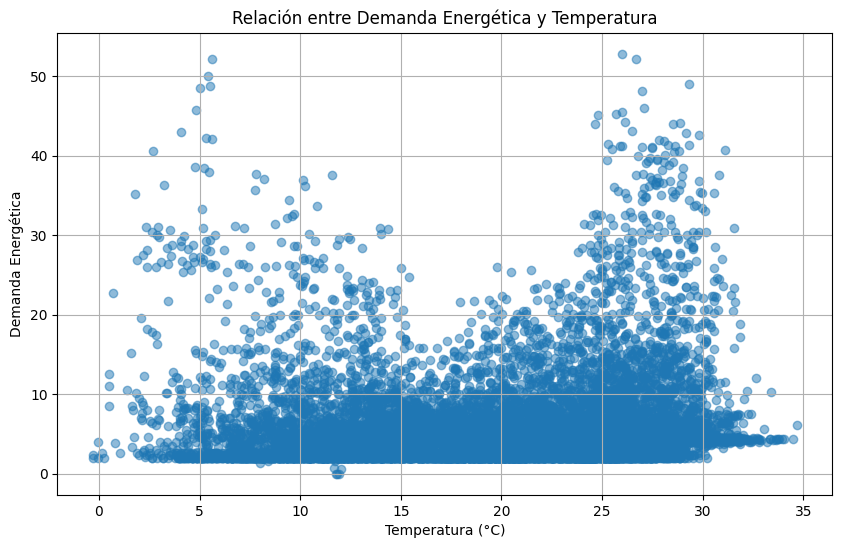

In [201]:
def plot_temp_vs_demand(df):
    df = df.copy()
    df.set_index("Date", inplace=True)
    df_1h = df.resample('1h').mean()
    plt.figure(figsize=(10, 6))
    plt.scatter(df_1h['temp [C]'], df_1h['Demand'], alpha=0.5)
    plt.title('Relación entre Demanda Energética y Temperatura')
    plt.xlabel('Temperatura (°C)')
    plt.ylabel('Demanda Energética')
    plt.grid(True)
    plt.show()
plot_temp_vs_demand(df)

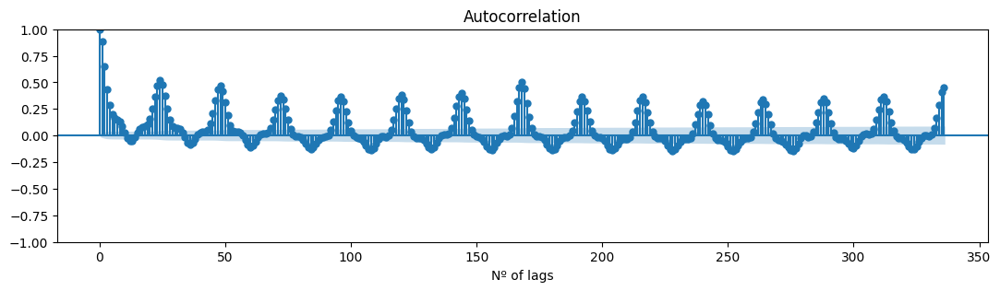

In [202]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#Gráfico de autocorrelación 1
def corrPlot(df):
    df = df.copy()
    df.set_index("Date", inplace=True)
    demand_df_1h = df.resample('1h').mean()
    fig, ax = plt.subplots(figsize=(13, 3))
    plt.xlabel("Nº of lags")
    plot_acf(demand_df_1h.Demand, ax=ax, lags=24*14)
    plt.show()
corrPlot(df)

In [203]:
def partcorrPlot(df):
    df = df.copy()
    df.set_index("Date", inplace=True)
    demand_df_1h = df.resample('1h').mean()
    fig, ax = plt.subplots(figsize=(13, 3))
    plt.xlabel("Nº of lags")
    plot_pacf(demand_df_1h.Demand, ax=ax, lags=24*14)
    plt.show()
#partcorrPlot(df)

Text(0.5, 1.0, 'Pearson Correlation Matrix')

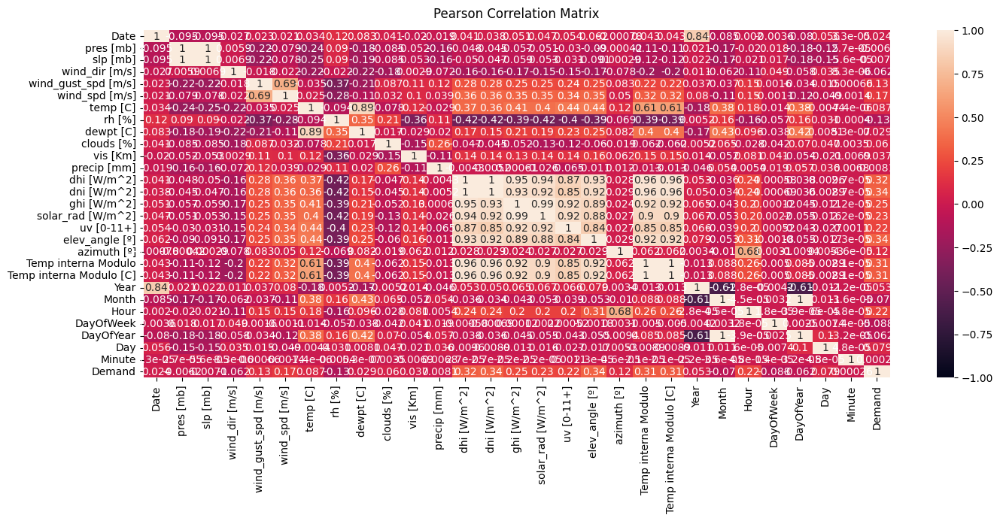

In [204]:
import seaborn as sns
#Correlation Map using Pearson Correlation
plt.figure(figsize=(16,6))
corr_df = df.copy()
#Drop Columns
heatmap = sns.heatmap(corr_df.corr('pearson'), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Pearson Correlation Matrix', fontdict={'fontsize': 12}, pad=12)

In [205]:
df.describe()["Demand"]

count    46753.000000
mean         6.146578
min          0.000000
25%          2.500000
50%          4.387000
75%          6.848000
max         55.696000
std          6.066826
Name: Demand, dtype: float64

In [206]:
def cyclical_encoding(df, cycle_length_list, columns):
    for col, cycle_length in zip(columns, cycle_length_list):
        if df[col].min == 0:
            df[f"{col}_sin"] = np.sin((df[col] / cycle_length) * np.pi * 2).round(4)
            df[f"{col}_cos"] = np.cos((df[col] / cycle_length) * np.pi * 2).round(4)
        else:
            df[f"{col}_sin"] = np.sin(((df[col] - 1) / cycle_length) * np.pi * 2).round(4)
            df[f"{col}_cos"] = np.cos(((df[col] - 1) / cycle_length) * np.pi * 2).round(4)
    return df

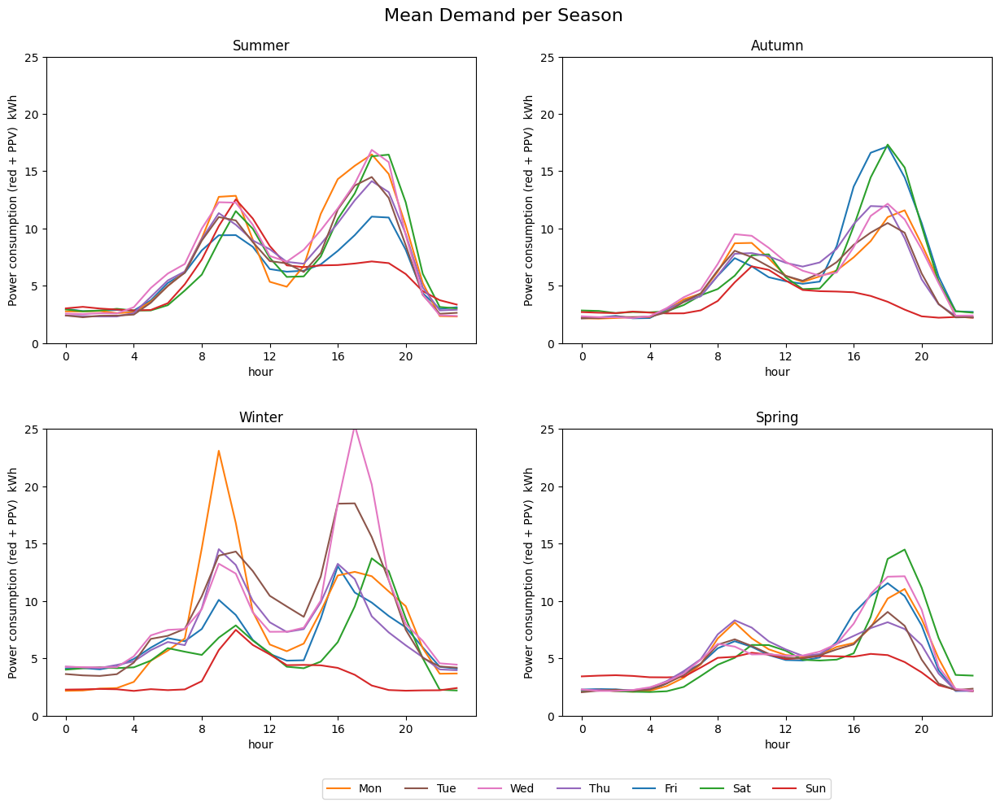

In [207]:
days_mapping = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}
df["Day"] = df["DayOfWeek"].map(days_mapping)
df["Season"] = df["Month"].apply(
    lambda x: (
        1 if x in [3, 4, 5] #Spring
        else 2 if x in [6, 7, 8] #Summer
        else 3 if x in [9, 10, 11] #Autumn
        else 0 #Winter
    )
)
fig, axes = plt.subplots(2, 2)
plt.subplots_adjust(wspace=0.2, hspace=0.3, top=0.92)
fig.suptitle("Mean Demand per Season", fontsize=16)

fig.set_figheight(10)
fig.set_figwidth(15)

ymin, ymax = 0, 25

#Season Summer
df.loc[df["Season"] == 2] \
    .groupby([df.loc[df["Season"] == 2]["Hour"], 'Day'])["Demand"].mean().unstack().plot(
        ax=axes[0, 0], ylim=(ymin, ymax), title="Summer", legend=False
    )
df.loc[df["Season"] == 3] \
    .groupby([df.loc[df["Season"] == 3]["Hour"], 'Day'])["Demand"].mean().unstack().plot(
        ax=axes[0, 1], ylim=(ymin, ymax), title="Autumn", legend=False
    )
df.loc[df["Season"] == 0] \
    .groupby([df.loc[df["Season"] == 0]["Hour"], 'Day'])["Demand"].mean().unstack().plot(
        ax=axes[1, 0], ylim=(ymin, ymax), title="Winter", legend=False
    )
df.loc[df["Season"] == 1] \
    .groupby([df.loc[df["Season"] == 1]["Hour"], 'Day'])["Demand"].mean().unstack().plot(
        ax=axes[1, 1], ylim=(ymin, ymax), title="Spring", legend=False
    )

for ax in axes.flat:
    ax.set(xlabel='hour', ylabel='Power consumption (red + PPV)  kWh')

for n in range(0, 2):
    axes[n, 0].set_xticks([0, 4, 8, 12, 16, 20])
    axes[n, 1].set_xticks([0, 4, 8, 12, 16, 20])
df = df.drop("Day", axis=1)
# LEGEND
handles, labels = plt.gca().get_legend_handles_labels() # reorder Legend Labels
order = [1,5,6,4,0,2,3]      # specify order in Legend
axes[1,1].legend([handles[i] for i in order], [labels[i] for i in order], loc=1, ncol=7, 
                 bbox_to_anchor=(0.638,-0.2), frameon=True) # print and order LEGEND

In [208]:
from sklearn.preprocessing import QuantileTransformer 
def addNLags(df, lags=1):
    lag_df= df.copy()
    for i in range(1, lags + 1):
        lag_df[f'lag_{i}'] = lag_df["Demand2"].shift(i * 24).fillna(0)

    return lag_df.fillna(0)

In [209]:
df2 = df.copy()

#Add isWeekend Column based in DayOfTheWeek Value
df2["isWeekend"] = df2["DayOfWeek"].isin([5, 6])

cycle_lengths = [24, 7, 12, 365]
cols = ["Hour", "DayOfWeek", "Month", "DayOfYear"]

df2 = cyclical_encoding(df2, cycle_lengths, cols)

quantile_transformer = QuantileTransformer(output_distribution='uniform', random_state=42) 
df2["Demand2"] = quantile_transformer.fit_transform(df2["Demand"].values.reshape(-1, 1)).flatten() 
df2 = addNLags(df2, 20)
df2 = df2.drop(columns=["Demand2"], axis=1)

df2.columns

Index(['Date', 'pres [mb]', 'slp [mb]', 'wind_dir [m/s]',
       'wind_gust_spd [m/s]', 'wind_spd [m/s]', 'temp [C]', 'rh [%]',
       'dewpt [C]', 'clouds [%]', 'vis [Km]', 'precip [mm]', 'dhi [W/m^2]',
       'dni [W/m^2]', 'ghi [W/m^2]', 'solar_rad [W/m^2]', 'uv [0-11+]',
       'elev_angle [º]', 'azimuth [º]', 'Temp interna Modulo',
       'Temp interna Modulo [C]', 'Year', 'Month', 'Hour', 'DayOfWeek',
       'DayOfYear', 'Minute', 'Demand', 'Season', 'isWeekend', 'Hour_sin',
       'Hour_cos', 'DayOfWeek_sin', 'DayOfWeek_cos', 'Month_sin', 'Month_cos',
       'DayOfYear_sin', 'DayOfYear_cos', 'lag_1', 'lag_2', 'lag_3', 'lag_4',
       'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', 'lag_11',
       'lag_12', 'lag_13', 'lag_14', 'lag_15', 'lag_16', 'lag_17', 'lag_18',
       'lag_19', 'lag_20'],
      dtype='object')

In [210]:
import holidays
def generateHolidayVar(df):
    df["Reduced_Date"] = df["Date"].dt.date
    list_holidays = holidays.Spain(prov="CT", years=list(df["Year"].unique()))
    list_holidays_dates = np.array(list(list_holidays.keys()), dtype='datetime64')
    df["isHoliday"] = df["Reduced_Date"].isin(list_holidays_dates)
    df = df.drop('Reduced_Date', axis=1)
    return df

df2 = generateHolidayVar(df2)
df2['Demand'] = df['Demand'].apply(lambda x: 2.0 if x < 2 else x)


df3 = df2.copy()
dates = df3["Date"]
df3 = df3.reset_index(drop=True)
df3.index

RangeIndex(start=0, stop=46753, step=1)

In [211]:
df3 = df3.drop(columns=[ "Minute", "Temp interna Modulo"], axis=1)
df3 = df3.rename(columns={'pres [mb]': 'pres', 'slp [mb]':'slp', 'wind_dir [m/s]': 'wind_dir', 'wind_gust_spd [m/s]': 'wind_gust_spd', 
    'wind_spd [m/s]': 'wind_spd', 'temp [C]': 'temp', 'app_temp [C]': 'app_temp', 'rh [%]': 'rh', 'dewpt [C]': 'dewpt','clouds [%]': 'clouds',
    'vis [Km]':'vis', 'precip [mm]': 'precip', 'dhi [W/m^2]': 'dhi', 'dni [W/m^2]': 'dni', 'ghi [W/m^2]': 'ghi', 'solar_rad [W/m^2]': 'solar_rad', 'uv [0-11+]': 'uv',
    'elev_angle [º]': 'elev_angle', 'azimuth [º]': 'az', 'Temp interna Modulo [C]': 'Temp interna Modulo'})
df3.to_csv('./prueba_csv.csv', index=None)
df3 = df3.drop(columns=["Date"], axis=1)

In [212]:
trainingSize = int(0.6 * df3.shape[0])
validationSize = int(0.2 * df3.shape[0]) + trainingSize
y = df3["Demand"]

X = df3.drop(columns=["Demand"], axis=1)
col_names = list(X.columns)

X_train, y_train = X.loc[:trainingSize].copy(), y.loc[:trainingSize].copy()
X_val, y_val = X.loc[trainingSize:validationSize, :].copy(), y.loc[trainingSize:validationSize].copy()
X_test, y_test = X.loc[validationSize:, :].copy(), y.loc[validationSize:].copy()

X_train_dates = dates.loc[:trainingSize].copy()
X_val_dates = dates.loc[trainingSize:validationSize].copy()
X_test_dates = dates.loc[validationSize:].copy()

print(f"Total Lags: {len(df3)}")
print(f"Training Size:{len(X_train)}")
print(f"Validation Size:{len(X_val)}")
print(f"Test Size: {len(X_test)}")

Total Lags: 46753
Training Size:28052
Validation Size:9351
Test Size: 9352


In [231]:
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn.metrics import mean_absolute_error, root_mean_squared_error

from sklearn.preprocessing import QuantileTransformer 
quantile_transformer = QuantileTransformer(output_distribution='uniform', random_state=42) 
y_train_transformed_quantile = quantile_transformer.fit_transform(y_train.values.reshape(-1, 1)).flatten() 
y_val_transformed_quantile = quantile_transformer.fit_transform(y_val.values.reshape(-1, 1)).flatten() 

regressorXGBR = XGBRegressor(objective='reg:absoluteerror', n_estimators=1500, learning_rate = 0.01, max_depth=7, colsample_bytree = 0.7, colsample_bynode = 0.7, gamma=7, random_state=123, eval_metric='mae', early_stopping_rounds=100)
regressorXGBR.fit(
    X = X_train,
    y = y_train_transformed_quantile,
    eval_set=[(X_val, y_val_transformed_quantile)]
)
'''
LGBM = LGBMRegressor(boosting_type='gbdt', n_estimators=1300, learning_rate=0.005, random_state=123, n_jobs=-1, verbose=0, early_stopping_rounds=100, max_depth=4)
LGBM.fit(
    X = X_train,
    y = y_train_transformed_quantile,
    eval_set=[(X_val, y_val_transformed_quantile)]
)
'''
knn = KNeighborsRegressor(n_neighbors=20, weights='distance')
knn.fit(
    X = X_train,
    y = y_train_transformed_quantile
)

[0]	validation_0-mae:0.26251
[1]	validation_0-mae:0.26026
[2]	validation_0-mae:0.25836
[3]	validation_0-mae:0.25643
[4]	validation_0-mae:0.25438
[5]	validation_0-mae:0.25269
[6]	validation_0-mae:0.25064
[7]	validation_0-mae:0.24873
[8]	validation_0-mae:0.24702
[9]	validation_0-mae:0.24512
[10]	validation_0-mae:0.24321
[11]	validation_0-mae:0.24174
[12]	validation_0-mae:0.24001
[13]	validation_0-mae:0.23820
[14]	validation_0-mae:0.23631
[15]	validation_0-mae:0.23438
[16]	validation_0-mae:0.23309
[17]	validation_0-mae:0.23146
[18]	validation_0-mae:0.22984
[19]	validation_0-mae:0.22819
[20]	validation_0-mae:0.22647
[21]	validation_0-mae:0.22471
[22]	validation_0-mae:0.22313
[23]	validation_0-mae:0.22156
[24]	validation_0-mae:0.22002
[25]	validation_0-mae:0.21833
[26]	validation_0-mae:0.21672
[27]	validation_0-mae:0.21528
[28]	validation_0-mae:0.21374
[29]	validation_0-mae:0.21214
[30]	validation_0-mae:0.21058
[31]	validation_0-mae:0.20916
[32]	validation_0-mae:0.20773
[33]	validation_0-ma

KNeighborsRegressor(n_neighbors=20, weights='distance')

In [229]:
y_pred = regressorXGBR.predict(X_test)
y_pred = quantile_transformer.inverse_transform(y_pred.reshape(-1, 1)).flatten()
print(f"XGBR MAE: {mean_absolute_error(y_test, y_pred)}, RMSE: {root_mean_squared_error(y_test, y_pred)}")

XGBR MAE: 1.5488274808800864, RMSE: 3.1860139084854913


In [232]:
y_pred = knn.predict(X_test)
y_pred = quantile_transformer.inverse_transform(y_pred.reshape(-1, 1)).flatten()
print(f"KNN MAE: {mean_absolute_error(y_test, y_pred)}, RMSE: {root_mean_squared_error(y_test, y_pred)}")

KNN MAE: 1.9830912237496754, RMSE: 3.8417394966120058


In [233]:
def plotPredictions(dates, y_pred, y_test):
    fig = go.Figure()
    trace1 = go.Scatter(x=dates, y=y_test, name="test", mode="lines")
    trace2 = go.Scatter(x=dates, y=y_pred, name="predictions", mode="lines")
    fig.add_trace(trace1)
    fig.add_trace(trace2)
    fig.update_layout(
        title="Real value vs Predicted in Test Data",
        xaxis_title="Date Time",
        yaxis_title="Demand",
        width=1020,
        height=450,
        margin = dict(l=70, r=20, t=55, b=20),
        legend = dict(
            orientation = "h",
            yanchor="top",
            y=1.1,
            xanchor="left",
            x=0.76
        )
    )
    fig.show()
plotPredictions(X_test_dates, y_pred, y_test)

In [226]:
plotPredictions(X_test_dates[:30*96], y_pred[:30*96], y_test[:30*96])

In [227]:
plotPredictions(X_test_dates[:96*7], y_pred[:96*7], y_test[:96*7])

In [218]:
from tqdm import tqdm
from sklearn.model_selection import ParameterGrid
paramsXGB = {
    'max_depth': [5, 7],
    'learning_rate': [0.05, 0.01, 0.005],
    'gamma': [3, 5, 7],
    'colsample_bytree' : [0.7, 0.9, 1],
    'colsample_bynode': [0.7, 0.9, 1],
    'n_estimators': [1200]
}
paramsLGBM = {
    'num_leaves': [10, 20, 30, 40],
    'learning_rate': [0.05, 0.01, 0.005],
    'colsample_bytree' : [0.7, 0.9, 1],
    'n_estimators': [1200],
    'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100]
}
def gridSearchXGB(params):
    best_mae = float('inf')
    config = {}
    for param in tqdm(ParameterGrid(params), total=len(list(ParameterGrid(params)))):
        max_depth = param.get('max_depth')
        n_estimators = param.get('n_estimators')
        lr = param.get('learning_rate')
        gamma = param.get('gamma')
        colsample_bytree = param.get('colsample_bytree')
        colsample_bynode = param.get('colsample_bynode')
        regressorXGBR = XGBRegressor(objective='reg:absoluteerror', n_estimators=n_estimators, learning_rate = lr, max_depth=max_depth, colsample_bytree = colsample_bytree, colsample_bynode = colsample_bynode, gamma=gamma, random_state=123, eval_metric='mae', early_stopping_rounds=100)

        regressorXGBR.fit(
            X = X_train,
            y = y_train_transformed_quantile,
            eval_set=[(X_val, y_val_transformed_quantile)],
            verbose=0
        )  
        y_pred = regressorXGBR.predict(X_test)
        y_pred = quantile_transformer.inverse_transform(y_pred.reshape(-1, 1)).flatten()
        mae = mean_absolute_error(y_test, y_pred)
        if mae < best_mae: 
            best_mae = mae
            config = param
        print(f"MAE: {mae}, n_Estimators: {n_estimators}, Learning_rate: {lr}, Max_depth: {max_depth}, Gamma: {gamma}, Col_Sample_By_Tree: {colsample_bytree}, Col_Sample_By_Node: {colsample_bynode}")
    config["mae"] = best_mae
    return config


def gridSearchLGBM(params):
    best_mae = float('inf')
    config = {}
    for param in tqdm(ParameterGrid(params), total=len(list(ParameterGrid(params)))):
        n_estimators = param.get('n_estimators')
        num_leaves = param.get('num_leaves')
        lr = param.get('learning_rate')
        reg_alpha = param.get('reg_alpha')
        colsample_bytree = param.get('colsample_bytree')
        LGBMReg = LGBMRegressor(boosting_type='gbdt', n_estimators=n_estimators, learning_rate=lr, random_state=123, reg_alpha=reg_alpha, n_jobs=-1, verbose=-1, early_stopping_rounds=100, num_leaves=num_leaves) 
        LGBMReg.fit(
            X = X_train,
            y = y_train_transformed_quantile,
            eval_set=[(X_val, y_val_transformed_quantile)]
        )  
        y_pred = LGBMReg.predict(X_test)
        y_pred = quantile_transformer.inverse_transform(y_pred.reshape(-1, 1)).flatten()
        mae = mean_absolute_error(y_test, y_pred)
        if mae < best_mae: 
            best_mae = mae
            config = param
        print(f"MAE: {mae}, n_Estimators: {n_estimators}, Learning_rate: {lr}, Num_leaves: {num_leaves}, Col_Sample_By_Tree: {colsample_bytree}, reg_alpha: {reg_alpha}")
    config["mae"] = best_mae
    return config
gridSearchXGB(paramsXGB)
#gridSearchLGBM(paramsLGBM)

  1%|          | 1/162 [00:05<15:24,  5.74s/it]

MAE: 1.58134994236703, n_Estimators: 1200, Learning_rate: 0.05, Max_depth: 5, Gamma: 3, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.7


  1%|          | 2/162 [00:11<14:41,  5.51s/it]

MAE: 1.5347117346381407, n_Estimators: 1200, Learning_rate: 0.05, Max_depth: 7, Gamma: 3, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.7


  2%|▏         | 3/162 [00:21<20:34,  7.76s/it]

MAE: 1.584471725680667, n_Estimators: 1200, Learning_rate: 0.01, Max_depth: 5, Gamma: 3, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.7


  2%|▏         | 3/162 [00:29<25:43,  9.70s/it]


KeyboardInterrupt: 

In [ ]:
from sklearn.model_selection import TimeSeriesSplit

def walkForwardValidation(X, y, X_test, y_test, fixed_train=False):
    n_splits = 10
    results = pd.DataFrame(columns=["RMSE_Test", "RMSE_Val", "MAE_Test", "MAE_Val","Mean_MRSE_Test", "Mean_MAE_Test", "Mean_RMSE_Val", "Mean_MAE_Val"])
    X_test2 = X_test.copy()
    X2 = X.copy()

    if fixed_train:
        tscv = TimeSeriesSplit(n_splits=n_splits, max_train_size=X.shape[0] // n_splits)
    else:
        tscv = TimeSeriesSplit(n_splits=n_splits)
    rmse_test, rmse_val, mae_test, mae_val = [], [], [], []
    for i, (train_index, eval_index) in enumerate(tscv.split(X2)):
        model = XGBRegressor(objective='reg:absoluteerror', n_estimators=2000, learning_rate = 0.005, max_depth=5, gamma=3, eval_metric="mae", random_state=123)
        X_train, X_val = X2[train_index], X2[eval_index]
        y_train, y_val = y[train_index], y[eval_index]
        model.fit(X=X_train, y=y_train)
    
        #Validation Scores
        y_pred_val = model.predict(X_val)
        mae_val = mean_absolute_error(y_val, y_pred_val)
        rmse_val = root_mean_squared_error(y_val, y_pred_val)
        
        #Test Scores
        y_pred_test = model.predict(X_test2)
        mae_test = mean_absolute_error(y_test, y_pred_test)
        rmse_test = root_mean_squared_error(y_test, y_pred_test)
            
        print(f"Val MAE: {mae_val}, Val RMSE: {rmse_val} Test MAE: {mae_test}, Test RMSE: {rmse_test}")
        results.loc[len(results.index)] = [rmse_test, rmse_val, mae_test, mae_val, np.mean(rmse_test), np.mean(mae_test), np.mean(rmse_val), np.mean(mae_val)] 
    return results

results = walkForwardValidation(pd.concat([X_train, X_val], axis=0).to_numpy(), pd.concat([y_train, y_val], axis=0).to_numpy(), X_test, y_test, fixed_train=False)


Val MAE: 1.8835072016059649, Val RMSE: 3.2143182508480392 Test MAE: 2.441141426765378, Test RMSE: 4.077343514300534
Val MAE: 2.223958870490579, Val RMSE: 4.2030316437837865 Test MAE: 2.04191244194944, Test RMSE: 3.9115461649531333
Val MAE: 1.5391873950237387, Val RMSE: 2.668377416259631 Test MAE: 1.824678549976508, Test RMSE: 3.628132204658643
Val MAE: 2.042143752578006, Val RMSE: 4.283117360344455 Test MAE: 1.7531826311224439, Test RMSE: 3.540942035631416
Val MAE: 3.960448519951877, Val RMSE: 7.472406418077168 Test MAE: 1.6809940552504474, Test RMSE: 3.4716373381511816
Val MAE: 5.48845694417673, Val RMSE: 7.1083130877555085 Test MAE: 1.6913991159211887, Test RMSE: 3.5164649593771364
Val MAE: 0.8029428807842031, Val RMSE: 1.379151206502612 Test MAE: 1.6856676914470639, Test RMSE: 3.539781398755172
Val MAE: 1.4237263323980218, Val RMSE: 2.75967234652229 Test MAE: 1.6572007359616057, Test RMSE: 3.500773149313934


KeyboardInterrupt: 

In [ ]:
quantile_transformer = QuantileTransformer(output_distribution='normal', random_state=42) 
y_train_transformed_quantile = quantile_transformer.fit_transform(y_train.values.reshape(-1, 1)).flatten() 
y_val_transformed_quantile = quantile_transformer.fit_transform(y_val.values.reshape(-1, 1)).flatten() 
regressorXGBR = XGBRegressor(objective='reg:absoluteerror', n_estimators=1500, learning_rate = 0.01, max_depth=7, colsample_bytree = 0.9, colsample_bynode = 0.9, gamma=5, random_state=123, eval_metric='mae', early_stopping_rounds=100)
regressorXGBR.fit(
    X = X_train,
    y = y_train_transformed_quantile,
    eval_set=[(X_val, y_val_transformed_quantile)]
)

y_pred = regressorXGBR.predict(X_test)
y_pred = quantile_transformer.inverse_transform(y_pred.reshape(-1, 1)).flatten()

mae = mean_absolute_error(y_test, y_pred)
rmse = root_mean_squared_error(y_test, y_pred)
print(f"MAE: {mae}, RMSE: {rmse}")

imp_df = pd.DataFrame(data=regressorXGBR.feature_importances_, index=regressorXGBR.feature_names_in_, columns=['importance'])
imp_df.sort_values(by=["importance"])

[0]	validation_0-mae:1.41920
[1]	validation_0-mae:1.40310
[2]	validation_0-mae:1.38836
[3]	validation_0-mae:1.37398
[4]	validation_0-mae:1.35856
[5]	validation_0-mae:1.34382
[6]	validation_0-mae:1.32893
[7]	validation_0-mae:1.31395
[8]	validation_0-mae:1.30137
[9]	validation_0-mae:1.29466
[10]	validation_0-mae:1.28285
[11]	validation_0-mae:1.27950
[12]	validation_0-mae:1.26990
[13]	validation_0-mae:1.25997
[14]	validation_0-mae:1.25480
[15]	validation_0-mae:1.24770
[16]	validation_0-mae:1.24436
[17]	validation_0-mae:1.24061
[18]	validation_0-mae:1.23081
[19]	validation_0-mae:1.22524
[20]	validation_0-mae:1.21973
[21]	validation_0-mae:1.21717
[22]	validation_0-mae:1.21238
[23]	validation_0-mae:1.20924
[24]	validation_0-mae:1.20676
[25]	validation_0-mae:1.20488
[26]	validation_0-mae:1.20321
[27]	validation_0-mae:1.20072
[28]	validation_0-mae:1.19656
[29]	validation_0-mae:1.19394
[30]	validation_0-mae:1.19216
[31]	validation_0-mae:1.19067
[32]	validation_0-mae:1.18893
[33]	validation_0-ma

,importance
wind_gust_spd,0.007071
wind_dir,0.007342
rh,0.007708
vis,0.007816
wind_spd,0.007821
lag_18,0.007923
lag_7,0.008218
lag_5,0.008409
lag_13,0.008528
lag_10,0.008548


100%|██████████| 55/55 [00:04<00:00, 12.15it/s]


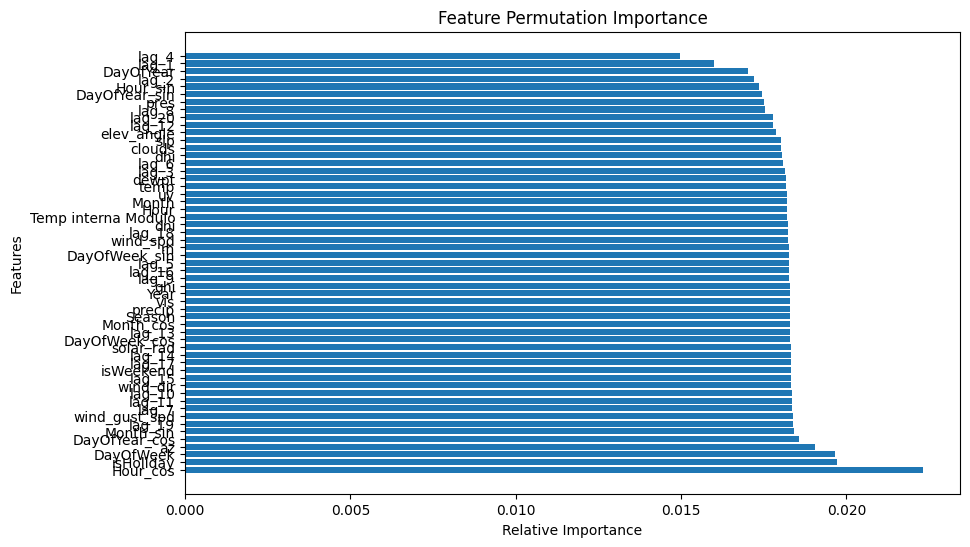

In [ ]:
from random import shuffle
def permutation_feature_importance(model, X_test, y_test, feature_names):
    y_pred = model.predict(X_test)
    y_pred = quantile_transformer.inverse_transform(y_pred.reshape(-1, 1)).flatten()

    #rmse_ref = root_mean_squared_error(y_test.flatten(), y_pred.flatten())
    mae_ref = mean_absolute_error(y_test, y_pred)

    feature_importance = np.zeros(X_test.shape[1])

    for i in tqdm(range(X_test.shape[1]), total=(X_test.shape[1])):
        #Make a Copy of the Test Subset and Permute its values
        X_test_permuted = X_test.copy()
        X_test_permuted[:, i] = shuffle(X_test_permuted[:, i])

        #Calculate the metrics
        y_pred_permuted = model.predict(X_test_permuted)
        #rmse_permuted = root_mean_squared_error(y_test.flatten(), y_pred_permuted.flatten())
        mae_permuted = mean_absolute_error(y_test, y_pred_permuted)

        #Calculate the difference in the metrics
        feature_importance[i] = mae_ref - mae_permuted
    
    #Normalize feature importances
    feature_importance /= feature_importance.sum()

    #Sort indexes
    sorted_indexes = feature_importance.argsort()[::-1]
    sorted_importances = feature_importance[sorted_indexes]
    sorted_importances_names = feature_names[sorted_indexes]

    #Bar Plot
    plt.figure(figsize=(10, 6))
    plt.barh(range(len(sorted_importances)), sorted_importances, align='center')
    plt.yticks(range(len(sorted_importances)), sorted_importances_names)
    plt.xlabel('Relative Importance')
    plt.ylabel('Features')
    plt.title('Feature Permutation Importance')
    plt.show()
permutation_feature_importance(regressorXGBR, X_test.to_numpy(), y_test.to_numpy(), np.array(col_names))